In [1]:
# Import packages
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import scale
from sklearn import decomposition

# Data importation, cleaning, & manipulation

In [2]:
# Import data
data = pd.read_csv('data.csv')
data.head()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,32894.0,Röyksopp,Röyksopp's Night Out,27.0,0.00468,0.652,-1.0,0.941,0.79200,A#,0.115,-5.201,Minor,0.0748,100.889,4-Apr,0.759,Electronic
1,46652.0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,218293.0,0.890,0.95000,D,0.124,-7.043,Minor,0.0300,115.00200000000001,4-Apr,0.531,Electronic
2,30097.0,Dillon Francis,Hurricane,28.0,0.00306,0.620,215613.0,0.755,0.01180,G#,0.534,-4.617,Major,0.0345,127.994,4-Apr,0.333,Electronic
3,62177.0,Dubloadz,Nitro,34.0,0.02540,0.774,166875.0,0.700,0.00253,C#,0.157,-4.498,Major,0.2390,128.014,4-Apr,0.270,Electronic
4,24907.0,What So Not,Divide & Conquer,32.0,0.00465,0.638,222369.0,0.587,0.90900,F#,0.157,-6.266,Major,0.0413,145.036,4-Apr,0.323,Electronic


In [3]:
# Print features
print(data.columns)

Index(['instance_id', 'artist_name', 'track_name', 'popularity',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'obtained_date', 'valence', 'music_genre'],
      dtype='object')


In [4]:
# Removing categorical variables that don't contribute to PCA
data.drop(columns=['instance_id', 'artist_name', 'track_name', 'obtained_date'], inplace=True)

In [5]:
# Convert duration to seconds and remove outliers
data['duration_sec'] = data['duration_ms']/1000

In [6]:
below_mean = data['duration_sec'] < 0
below_mean.value_counts()

False    45066
True      4939
Name: duration_sec, dtype: int64

In [7]:
# Keeping songs with times greater than 0 seconds
data = data.loc[data['duration_sec'] > 0 ]

In [8]:
data['duration_sec'].describe()

count    45061.000000
mean       245.503541
std        111.433254
min         15.509000
25%        190.467000
50%        227.360000
75%        275.680000
max       4830.606000
Name: duration_sec, dtype: float64

In [9]:
# Dropping 'duration_ms' column
data.drop(columns=['duration_ms'], inplace=True)

In [10]:
# Setting 'popularity' to approx. 0-1 range
data['popularity'] = data['popularity']/100

In [11]:
# 'tempo' is set as an object and contains "?" values.  Cleaning and transforming
question_marks = data[data['tempo'] == '?']

In [12]:
data = data.loc[data['tempo'] != '?']
data['tempo'] = data['tempo'].astype(float)

In [13]:
# Using LabelEncoder to transform useful categorical variables
le = LabelEncoder()
data['key']=le.fit_transform(data['key'])
data['mode']=le.fit_transform(data['mode'])
data['music_genre'] = le.fit_transform(data['music_genre'])

In [14]:
# Dropping rows with NaN values
data.dropna(inplace=True)

In [15]:
data.head()

,popularity,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre,duration_sec
1,0.31,0.01270,0.622,0.890,0.950000,5,0.124,-7.043,1,0.0300,115.002,0.531,5,218.293
2,0.28,0.00306,0.620,0.755,0.011800,11,0.534,-4.617,0,0.0345,127.994,0.333,5,215.613
3,0.34,0.02540,0.774,0.700,0.002530,4,0.157,-4.498,0,0.2390,128.014,0.270,5,166.875
4,0.32,0.00465,0.638,0.587,0.909000,9,0.157,-6.266,0,0.0413,145.036,0.323,5,222.369
6,0.46,0.02890,0.572,0.803,0.000008,2,0.106,-4.294,0,0.3510,149.995,0.230,5,214.408


In [16]:
# Selecting input and output variables
X = data.iloc[:, :13]
Y = data.music_genre

In [17]:
# Data dimensions for X & Y
X.shape

(40560, 13)

In [18]:
Y.shape

(40560,)

In [19]:
# Scaling data
X = scale(X)

In [20]:
# Using Scatter Coefficient to determine if PCA will be useful with this data
def scatter_coefficient(X, normalize=True):
    corr = np.corrcoef(X, rowvar=False)
    if normalize:
        return np.linalg.det(corr) / np.trace(corr)
    else:
        return np.linalg.det(corr)
    
result = scatter_coefficient(X, normalize=True)
print(result)

0.0012759265779483985


# Principal Component Analysis

In [21]:
# Performing PCA
pca = decomposition.PCA(n_components=3)
pca.fit(X)

PCA(n_components=3)

In [22]:
# Computing the scores values
scores = pca.transform(X)

In [23]:
scores_df = pd.DataFrame(scores, columns=['PC1', 'PC2', 'PC3'])
scores_df

,PC1,PC2,PC3
0,-0.024652,-0.675327,0.708801
1,-0.927295,-1.545958,-0.418213
2,-1.312572,0.070092,0.275626
3,0.387874,-0.821338,-0.753619
4,-1.593065,0.107174,1.055704
...,...,...,...
40555,-1.486682,0.811722,-0.570494
40556,-0.274111,1.581686,-0.271031
40557,-1.562476,0.301051,-0.348091
40558,-0.925408,1.710072,-0.453862


In [24]:
# Labelling the transformed 'music_genre' variable and values
Y_label = []

for i in Y:
  if i == 0:
    Y_label.append('Alternative')
  elif i == 1:
    Y_label.append('Anime')
  elif i == 2:
    Y_label.append('Blues')  
  elif i == 3:
    Y_label.append('Classical')  
  elif i == 4:
    Y_label.append('Country')
  elif i == 5:
    Y_label.append('Electronic')
  elif i == 6:
    Y_label.append('Hip-Hop')
  elif i == 7:
    Y_label.append('Jazz')
  elif i == 8:
    Y_label.append('Rap')
  else:
    Y_label.append('Rock')

Genres = pd.DataFrame(Y_label, columns=['music_genre'])

In [25]:
df_scores = pd.concat([scores_df, Genres], axis = 1)

In [26]:
# Retrieving the loadings values
# Created a df copy without the 'music_genre' variable to use as an index
data_index = data.drop(columns='music_genre').copy()

In [27]:
print(data_index.columns)

Index(['popularity', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'valence', 'duration_sec'],
      dtype='object')


In [28]:
loadings = pca.components_.T
df_loadings = pd.DataFrame(loadings, columns=['PC1', 'PC2', 'PC3'], index= data_index.columns)
df_loadings

,PC1,PC2,PC3
popularity,-0.271548,0.457302,-0.050543
acousticness,0.418952,0.197298,-0.044579
danceability,-0.307062,0.324833,-0.123854
energy,-0.429782,-0.302094,0.048292
instrumentalness,0.333415,-0.020001,0.106851
key,0.006008,-0.031666,-0.448619
liveness,-0.080824,-0.215549,0.392311
loudness,-0.450897,-0.189915,-0.006199
mode,-0.009705,0.106284,0.619230
speechiness,-0.178675,0.254955,0.385102


In [29]:
# Explained variance for each PC
explained_variance = pca.explained_variance_ratio_
explained_variance

array([0.28703666, 0.12402705, 0.08419025])

# Creating Scree Plots

In [30]:
# Preparing the array for plotting
explained_variance = np.insert(explained_variance, 0, 0)

In [31]:
# Preparing the cumulative variance data
cumulative_variance = np.cumsum(np.round(explained_variance, decimals=3))

In [32]:
# Combining the data
pc_df = pd.DataFrame(['','PC1', 'PC2', 'PC3'], columns=['PC'])
explained_variance_df = pd.DataFrame(explained_variance, columns=['Explained Variance'])
cumulative_variance_df = pd.DataFrame(cumulative_variance, columns=['Cumulative Variance'])

In [33]:
df_explained_variance = pd.concat([pc_df, explained_variance_df, cumulative_variance_df], axis=1)
df_explained_variance

,PC,Explained Variance,Cumulative Variance
0,,0.000000,0.000
1,PC1,0.287037,0.287
2,PC2,0.124027,0.411
3,PC3,0.084190,0.495


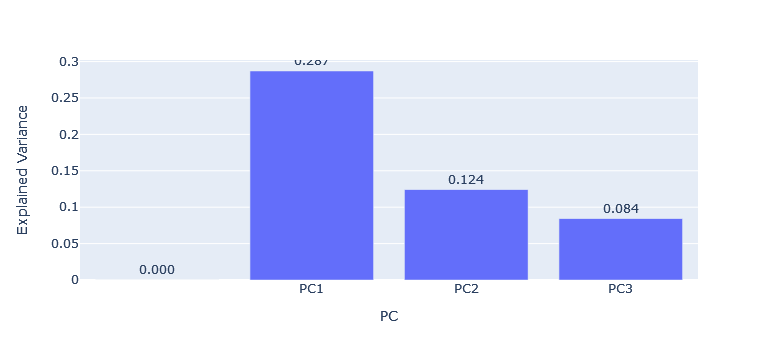

In [34]:
fig = px.bar(df_explained_variance, 
             x='PC', y='Explained Variance',
             text='Explained Variance',
             width=800)

fig.update_traces(texttemplate='%{text:.3f}', textposition='outside')
fig.show()

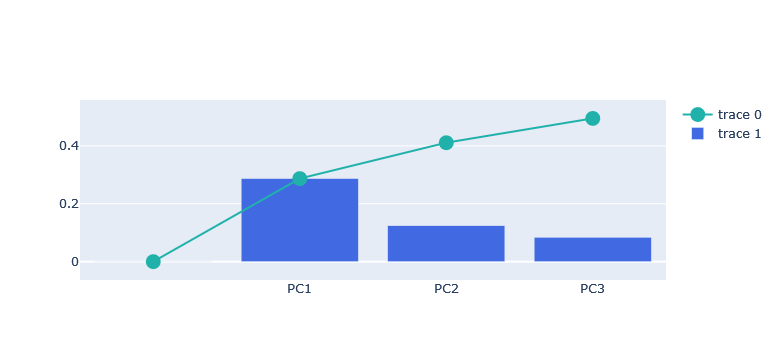

In [35]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=df_explained_variance['PC'],
        y=df_explained_variance['Cumulative Variance'],
        marker=dict(size=15, color="LightSeaGreen")
    ))

fig.add_trace(
    go.Bar(
        x=df_explained_variance['PC'],
        y=df_explained_variance['Explained Variance'],
        marker=dict(color="RoyalBlue")
    ))

fig.show()

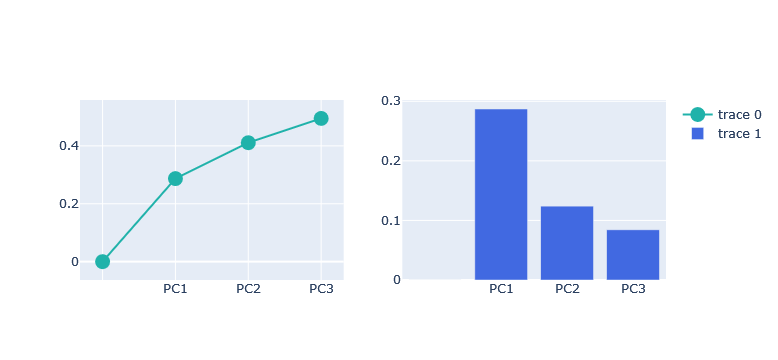

In [36]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Scatter(
        x=df_explained_variance['PC'],
        y=df_explained_variance['Cumulative Variance'],
        marker=dict(size=15, color="LightSeaGreen")
    ), row=1, col=1
    )

fig.add_trace(
    go.Bar(
        x=df_explained_variance['PC'],
        y=df_explained_variance['Explained Variance'],
        marker=dict(color="RoyalBlue"),
    ), row=1, col=2
    )

fig.show()

# Scores Plot

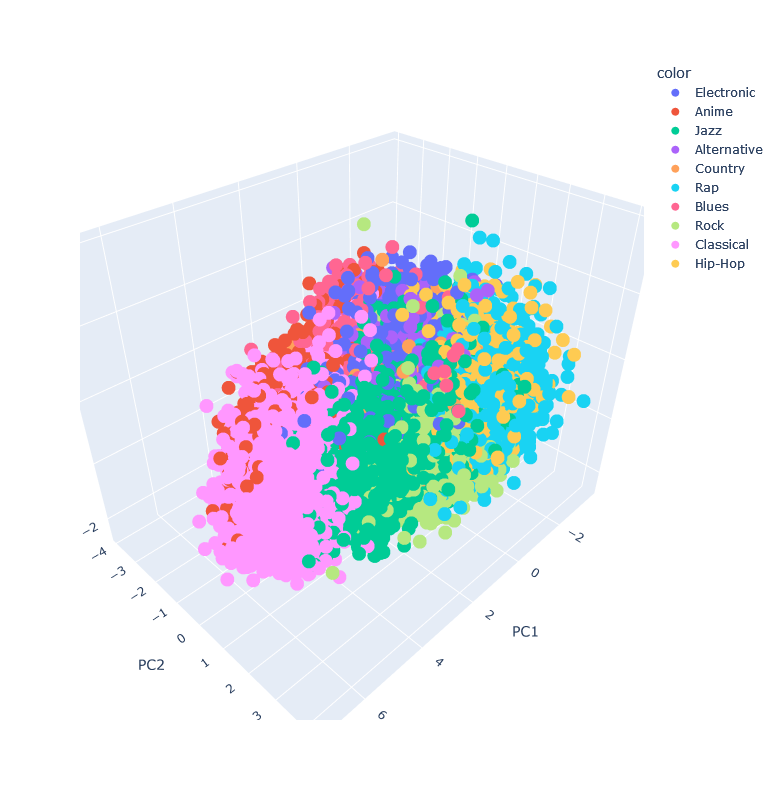

In [37]:
# 3D Scatter Plot
fig = px.scatter_3d(scores_df, x='PC1', y='PC2', z='PC3',
              color=Genres['music_genre'])
fig.update_layout(height=800, width=1200)
fig.show()

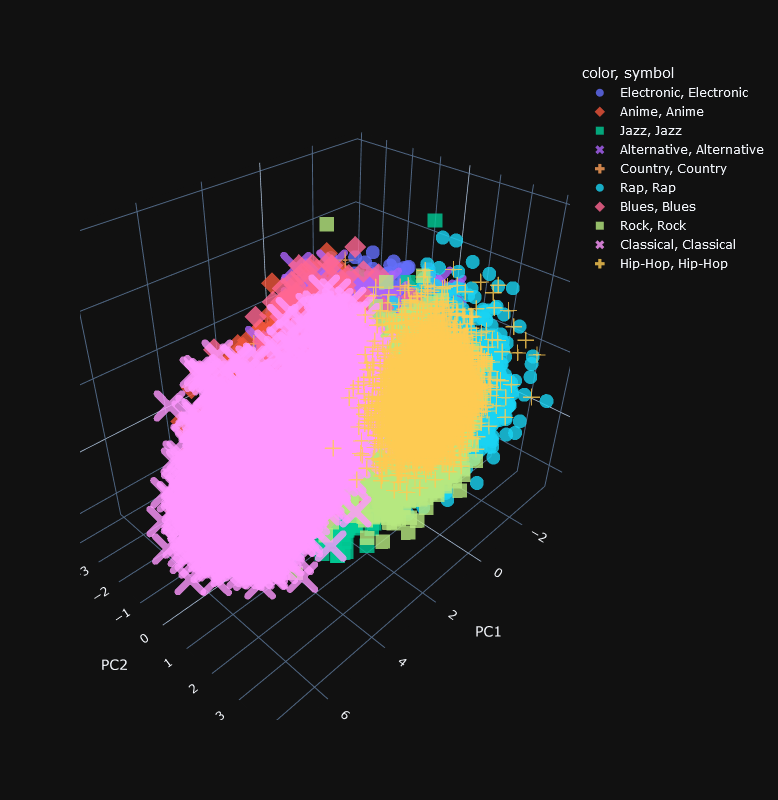

In [40]:
# Customized 3D Scatter Plot
fig = px.scatter_3d(df_scores, x='PC1', y='PC2', z='PC3',
              color=Genres['music_genre'],
              symbol=Genres['music_genre'],
              opacity=0.8)

fig.update_layout(template='plotly_dark')
fig.update_layout(height=800, width=1200)
fig.show()

# Loadings Plot

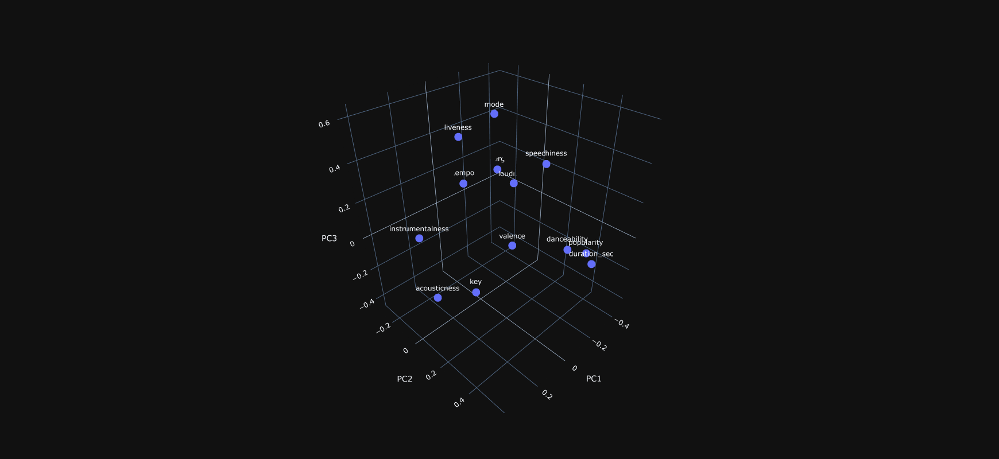

In [41]:
loadings_label = df_loadings.index

fig = px.scatter_3d(df_loadings, x='PC1', y='PC2', z='PC3',
                    text = loadings_label)
fig.update_layout(template='plotly_dark')
fig.update_layout(height=800, width=1200)
fig.show()